<a href="https://colab.research.google.com/github/goody139/Deep_Learning_For_Image_Generation/blob/main/DeepFakeFaceSwap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#DeepFake Face Swap

This demo is meant to give you an introduction or approach to DeepFake Face Swap. The idea is that you can follow the structure of the architecture along the demo and that you can try out your own pictures / videos for generation. Feel free to share your results in the forum!

### Outline
- Prerequisits (Checking GPU and CUDA versions , download & import libraries, ...)
- Creating / Initializing the model
- Putting Source and Target into model
- Visualizing results

The model is based on this paper https://doi.org/10.3390/app13116711 and
the Code is based on this source : https://github.com/ai-forever/ghost/blob/647049c4635f6aa3da7883f0790dc5561f087465


*Keep in mind to choose the GPU of Colab for a smoother and faster execution. If you are running the notebook with default parameters and the GPU of Google Colab the notebook is usually taking around 5 minutes to compile.*




##GHOST: Generative High-fidelity One Shot Transfer

Deep fake stands for a face swapping algorithm where the source and target can be an image or a video. Researchers have investigated sophisticated generative adversarial networks (GAN), autoencoders, and other approaches to establish precise and robust algorithms for face swapping. One example is GHOST which is a new face swap approach for image-to-video and image-to-image tasks - GHOST (Generative High fidelity One Shot Transfer). Above you can see a few example results.



<img src="https://drive.google.com/uc?export=view&id=1MdOWxP9CqyqmW6t9MQ6-gcfEux54zbqP">

## Prerequisits

In [ ]:
#@markdown #**Check GPU and CUDA version**

!nvidia-smi

!nvcc --version

Sun Jul  9 13:07:42 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   66C    P8    11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#@markdown #**Clone github**

!git clone https://github.com/sberbank-ai/sber-swap.git
%cd sber-swap

# load arcface
!wget -P ./arcface_model https://github.com/sberbank-ai/sber-swap/releases/download/arcface/backbone.pth
!wget -P ./arcface_model https://github.com/sberbank-ai/sber-swap/releases/download/arcface/iresnet.py

# load landmarks detector
!wget -P ./insightface_func/models/antelope https://github.com/sberbank-ai/sber-swap/releases/download/antelope/glintr100.onnx
!wget -P ./insightface_func/models/antelope https://github.com/sberbank-ai/sber-swap/releases/download/antelope/scrfd_10g_bnkps.onnx

# load helper functions for model
!wget -P ./weights https://github.com/sberbank-ai/sber-swap/releases/download/sber-swap-v2.0/G_unet_2blocks.pth

# load super res model
!wget -P ./weights https://github.com/sberbank-ai/sber-swap/releases/download/super-res/10_net_G.pth

Cloning into 'sber-swap'...
remote: Enumerating objects: 704, done.
remote: Total 704 (delta 0), reused 0 (delta 0), pack-reused 704
Receiving objects: 100% (704/704), 93.99 MiB | 46.30 MiB/s, done.
Resolving deltas: 100% (176/176), done.
/content/sber-swap
--2023-07-09 13:07:45--  https://github.com/sberbank-ai/sber-swap/releases/download/arcface/backbone.pth
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/ai-forever/ghost/releases/download/arcface/backbone.pth [following]
--2023-07-09 13:07:46--  https://github.com/ai-forever/ghost/releases/download/arcface/backbone.pth
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://objects.githubusercontent.com/github-production-release-asset-2e65be/437939371/bfc1b827-8d3a-4001-863c-d6d04ffb1258?X-Amz-Algorithm=AWS4-HMAC-S

In [ ]:
#@markdown #**Install required libraries**

!pip install mxnet-cu112
!pip install onnxruntime-gpu==1.12
!pip install insightface==0.2.1
!pip install kornia==0.5.4
!pip install dill

!rm /usr/local/lib/python3.10/dist-packages/insightface/model_zoo/model_zoo.py #change the path to python in case you use a different version
!wget -P /usr/local/lib/python3.10/dist-packages/insightface/model_zoo/ https://github.com/AlexanderGroshev/insightface/releases/download/model_zoo/model_zoo.py #change the path to python in case you use a different version

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 499.4/499.4 MB 1.4 MB/s eta 0:00:00
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.20.1
    Uninstalling graphviz-0.20.1:
      Successfully uninstalled graphviz-0.20.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 90.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.7/285.7 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 4.1 MB/s eta 0:00:00
--2023-07-09 13:08:52--  https://github.com/AlexanderGroshev/insightface/releases/download/model_zoo/model_zoo.py
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response.

In [ ]:
#@markdown #**Imports**

import cv2
import torch
import time
import os
import math
import torch.nn.functional as F
from torch import nn
from torch.nn import Parameter
from typing import List, Tuple, Callable, Any
import numpy as np
from tqdm import tqdm
from scipy.spatial import distance

from utils.inference.image_processing import crop_face, get_final_image, show_images
from utils.inference.video_processing import read_video, get_target, get_final_video, add_audio_from_another_video, face_enhancement
from utils.inference.core import model_inference


from network.AEI_Net import AEI_Net
from coordinate_reg.image_infer import Handler
from insightface_func.face_detect_crop_multi import Face_detect_crop
from arcface_model.iresnet import iresnet100
from models.pix2pix_model import Pix2PixModel
from models.config_sr import TestOptions
import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.10/dist-packages/kornia/augmentation/augmentation.py:1830: DeprecationWarning: GaussianBlur is no longer maintained and will be removed from the future versions. Please use RandomGaussianBlur instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mxnet/numpy/utils.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bool = onp.bool
/usr/local/lib/python3.10/dist-packages/mxnet/numpy/fallback.py:143: DeprecationWarning: In accordance with NEP 32, the function mirr was removed from NumPy version 1.20.  A replacement for this function is available in the numpy_financial library: https://pypi.org/project/numpy-financial
  mirr = onp.mirr

## Model

**How does GHOST work?**

GHOST is mainly based on the AEI-Net. The procedure is displayed above in the picture. The architecture is build like the following:

-  Identity Encoder
 -   (target) features extracted from X_s using the *pretrained* ArcFace model
-Attribute Encoder
 - Attribute features extraction from X_t using U-Net architecture
- AAD Generator
 - Attribute and identity features fusion + creation of output image ˆYs,t, which saves the ’identity’ of a
person from Xs and attributes from Xt




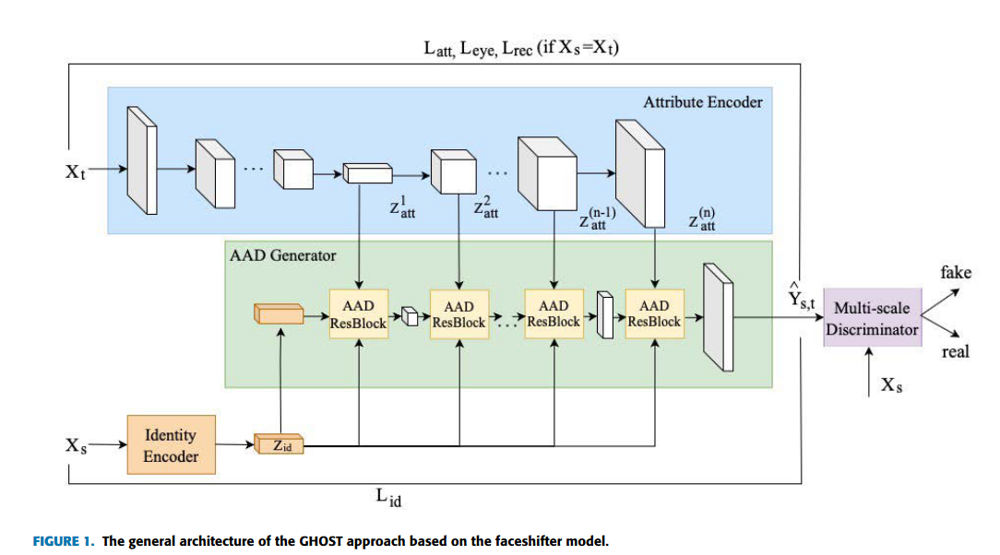

### The AEI-net

In [ ]:
# Attribute Encoder

class MLAttrEncoder(nn.Module):
    def __init__(self, backbone):
        super(MLAttrEncoder, self).__init__()
        self.backbone = backbone
        self.conv1 = conv4x4(3, 32)
        self.conv2 = conv4x4(32, 64)
        self.conv3 = conv4x4(64, 128)
        self.conv4 = conv4x4(128, 256)
        self.conv5 = conv4x4(256, 512)
        self.conv6 = conv4x4(512, 1024)
        self.conv7 = conv4x4(1024, 1024)

        if backbone == 'unet':
            self.deconv1 = deconv4x4(1024, 1024)
            self.deconv2 = deconv4x4(2048, 512)
            self.deconv3 = deconv4x4(1024, 256)
            self.deconv4 = deconv4x4(512, 128)
            self.deconv5 = deconv4x4(256, 64)
            self.deconv6 = deconv4x4(128, 32)
        elif backbone == 'linknet':
            self.deconv1 = deconv4x4(1024, 1024)
            self.deconv2 = deconv4x4(1024, 512)
            self.deconv3 = deconv4x4(512, 256)
            self.deconv4 = deconv4x4(256, 128)
            self.deconv5 = deconv4x4(128, 64)
            self.deconv6 = deconv4x4(64, 32)
        self.apply(weight_init)

    def forward(self, Xt):
        feat1 = self.conv1(Xt)
        # 32x128x128
        feat2 = self.conv2(feat1)
        # 64x64x64
        feat3 = self.conv3(feat2)
        # 128x32x32
        feat4 = self.conv4(feat3)
        # 256x16xx16
        feat5 = self.conv5(feat4)
        # 512x8x8
        feat6 = self.conv6(feat5)
        # 1024x4x4
        z_attr1 = self.conv7(feat6)
        # 1024x2x2

        z_attr2 = self.deconv1(z_attr1, feat6, self.backbone)
        z_attr3 = self.deconv2(z_attr2, feat5, self.backbone)
        z_attr4 = self.deconv3(z_attr3, feat4, self.backbone)
        z_attr5 = self.deconv4(z_attr4, feat3, self.backbone)
        z_attr6 = self.deconv5(z_attr5, feat2, self.backbone)
        z_attr7 = self.deconv6(z_attr6, feat1, self.backbone)
        z_attr8 = F.interpolate(z_attr7, scale_factor=2, mode='bilinear', align_corners=True)
        return z_attr1, z_attr2, z_attr3, z_attr4, z_attr5, z_attr6, z_attr7, z_attr8

In [ ]:
# AAD Layer + Generator

class AADLayer(nn.Module):
    def __init__(self, c_x, attr_c, c_id):
        super(AADLayer, self).__init__()
        self.attr_c = attr_c
        self.c_id = c_id
        self.c_x = c_x

        self.conv1 = nn.Conv2d(attr_c, c_x, kernel_size=1, stride=1, padding=0, bias=True)
        self.conv2 = nn.Conv2d(attr_c, c_x, kernel_size=1, stride=1, padding=0, bias=True)
        self.fc1 = nn.Linear(c_id, c_x)
        self.fc2 = nn.Linear(c_id, c_x)
        self.norm = nn.InstanceNorm2d(c_x, affine=False)

        self.conv_h = nn.Conv2d(c_x, 1, kernel_size=1, stride=1, padding=0, bias=True)

    def forward(self, h_in, z_attr, z_id):
        h = self.norm(h_in)
        gamma_attr = self.conv1(z_attr)
        beta_attr = self.conv2(z_attr)
        gamma_id = self.fc1(z_id)
        beta_id = self.fc2(z_id)
        A = gamma_attr * h + beta_attr
        gamma_id = gamma_id.reshape(h.shape[0], self.c_x, 1, 1).expand_as(h)
        beta_id = beta_id.reshape(h.shape[0], self.c_x, 1, 1).expand_as(h)
        I = gamma_id * h + beta_id
        M = torch.sigmoid(self.conv_h(h))
        out = (torch.ones_like(M).to(M.device) - M) * A + M * I
        return out


class AddBlocksSequential(nn.Sequential):
    def forward(self, *inputs):
        h, z_attr, z_id = inputs
        for i, module in enumerate(self._modules.values()):
            if i%3 == 0 and i > 0:
                inputs = (inputs, z_attr, z_id)
            if type(inputs) == tuple:
                inputs = module(*inputs)
            else:
                inputs = module(inputs)
        return inputs


class AAD_ResBlk(nn.Module):
    def __init__(self, cin, cout, c_attr, c_id, num_blocks):
        super(AAD_ResBlk, self).__init__()
        self.cin = cin
        self.cout = cout

        add_blocks = []
        for i in range(num_blocks):
            out = cin if i < (num_blocks-1) else cout
            add_blocks.extend([AADLayer(cin, c_attr, c_id),
                               nn.ReLU(inplace=True),
                               nn.Conv2d(cin, out, kernel_size=3, stride=1, padding=1, bias=False)
                              ])
        self.add_blocks = AddBlocksSequential(*add_blocks)

        if cin != cout:
            last_add_block = [AADLayer(cin, c_attr, c_id),
                             nn.ReLU(inplace=True),
                             nn.Conv2d(cin, cout, kernel_size=3, stride=1, padding=1, bias=False)]
            self.last_add_block = AddBlocksSequential(*last_add_block)


    def forward(self, h, z_attr, z_id):
        x =  self.add_blocks(h, z_attr, z_id)
        if self.cin != self.cout:
            h = self.last_add_block(h, z_attr, z_id)
        x = x + h
        return x

class AADGenerator(nn.Module):
    def __init__(self, backbone, c_id=256, num_blocks=2):
        super(AADGenerator, self).__init__()
        self.up1 = nn.ConvTranspose2d(c_id, 1024, kernel_size=2, stride=1, padding=0)
        self.AADBlk1 = AAD_ResBlk(1024, 1024, 1024, c_id, num_blocks)
        if backbone == 'linknet':
            self.AADBlk2 = AAD_ResBlk(1024, 1024, 1024, c_id, num_blocks)
            self.AADBlk3 = AAD_ResBlk(1024, 1024, 512, c_id, num_blocks)
            self.AADBlk4 = AAD_ResBlk(1024, 512, 256, c_id, num_blocks)
            self.AADBlk5 = AAD_ResBlk(512, 256, 128, c_id, num_blocks)
            self.AADBlk6 = AAD_ResBlk(256, 128, 64, c_id, num_blocks)
            self.AADBlk7 = AAD_ResBlk(128, 64, 32, c_id, num_blocks)
            self.AADBlk8 = AAD_ResBlk(64, 3, 32, c_id, num_blocks)
        else:
            self.AADBlk2 = AAD_ResBlk(1024, 1024, 2048, c_id, num_blocks)
            self.AADBlk3 = AAD_ResBlk(1024, 1024, 1024, c_id, num_blocks)
            self.AADBlk4 = AAD_ResBlk(1024, 512, 512, c_id, num_blocks)
            self.AADBlk5 = AAD_ResBlk(512, 256, 256, c_id, num_blocks)
            self.AADBlk6 = AAD_ResBlk(256, 128, 128, c_id, num_blocks)
            self.AADBlk7 = AAD_ResBlk(128, 64, 64, c_id, num_blocks)
            self.AADBlk8 = AAD_ResBlk(64, 3, 64, c_id, num_blocks)

        self.apply(weight_init)

    def forward(self, z_attr, z_id):
        m = self.up1(z_id.reshape(z_id.shape[0], -1, 1, 1))
        m2 = F.interpolate(self.AADBlk1(m, z_attr[0], z_id), scale_factor=2, mode='bilinear', align_corners=True)
        m3 = F.interpolate(self.AADBlk2(m2, z_attr[1], z_id), scale_factor=2, mode='bilinear', align_corners=True)
        m4 = F.interpolate(self.AADBlk3(m3, z_attr[2], z_id), scale_factor=2, mode='bilinear', align_corners=True)
        m5 = F.interpolate(self.AADBlk4(m4, z_attr[3], z_id), scale_factor=2, mode='bilinear', align_corners=True)
        m6 = F.interpolate(self.AADBlk5(m5, z_attr[4], z_id), scale_factor=2, mode='bilinear', align_corners=True)
        m7 = F.interpolate(self.AADBlk6(m6, z_attr[5], z_id), scale_factor=2, mode='bilinear', align_corners=True)
        m8 = F.interpolate(self.AADBlk7(m7, z_attr[6], z_id), scale_factor=2, mode='bilinear', align_corners=True)
        y = self.AADBlk8(m8, z_attr[7], z_id)
        return torch.tanh(y)

In [ ]:
# Fully composed AEI net

class AEI_Net(nn.Module):
    def __init__(self, backbone, num_blocks=2, c_id=256):
        super(AEI_Net, self).__init__()
        if backbone in ['unet', 'linknet']:
            self.encoder = MLAttrEncoder(backbone)
        elif backbone == 'resnet':
            self.encoder = MLAttrEncoderResnet()
        self.generator = AADGenerator(backbone, c_id, num_blocks)

    def forward(self, Xt, z_id):
        attr = self.encoder(Xt)
        Y = self.generator(attr, z_id)
        return Y, attr

    def get_attr(self, X):
        return self.encoder(X)

In [ ]:
# Layer structure

def weight_init(m):
    if isinstance(m, nn.Linear):
        m.weight.data.normal_(0, 0.001)
        m.bias.data.zero_()
    if isinstance(m, nn.Conv2d):
        nn.init.xavier_normal_(m.weight.data)

    if isinstance(m, nn.ConvTranspose2d):
        nn.init.xavier_normal_(m.weight.data)


def conv4x4(in_c, out_c, norm=nn.BatchNorm2d):
    return nn.Sequential(
        nn.Conv2d(in_channels=in_c, out_channels=out_c, kernel_size=4, stride=2, padding=1, bias=False),
        norm(out_c),
        nn.LeakyReLU(0.1, inplace=True)
    )


class deconv4x4(nn.Module):
    def __init__(self, in_c, out_c, norm=nn.BatchNorm2d):
        super(deconv4x4, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels=in_c, out_channels=out_c, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn = norm(out_c)
        self.lrelu = nn.LeakyReLU(0.1, inplace=True)

    def forward(self, input, skip, backbone):
        x = self.deconv(input)
        x = self.bn(x)
        x = self.lrelu(x)
        if backbone == 'linknet':
            return x+skip
        else:
            return torch.cat((x, skip), dim=1)

##Initialize Model


In [ ]:
app = Face_detect_crop(name='antelope', root='./insightface_func/models')
app.prepare(ctx_id= 0, det_thresh=0.6, det_size=(640,640))

# main model for generation
G = AEI_Net(backbone='unet', num_blocks=2, c_id=512)
G.eval()
G.load_state_dict(torch.load('weights/G_unet_2blocks.pth', map_location=torch.device('cpu')))
G = G.cuda()
G = G.half()

# arcface model to get face embedding
netArc = iresnet100(fp16=False)
netArc.load_state_dict(torch.load('arcface_model/backbone.pth'))
netArc=netArc.cuda()
netArc.eval()

# model to get face landmarks
handler = Handler('./coordinate_reg/model/2d106det', 0, ctx_id=0, det_size=640)

# model to make superres of face, set use_sr=True if you want to use super resolution or use_sr=False if you don't
use_sr = False
if use_sr:
    os.environ['CUDA_VISIBLE_DEVICES'] = '0'
    torch.backends.cudnn.benchmark = True
    opt = TestOptions()
    model = Pix2PixModel(opt)
    model.netG.train()



input mean and std: 127.5 127.5
find model: ./insightface_func/models/antelope/glintr100.onnx recognition
find model: ./insightface_func/models/antelope/scrfd_10g_bnkps.onnx detection
set det-size: (640, 640)
loading ./coordinate_reg/model/2d106det 0
input mean and std: 127.5 127.5
find model: ./insightface_func/models/antelope/glintr100.onnx recognition
find model: ./insightface_func/models/antelope/scrfd_10g_bnkps.onnx detection
set det-size: (640, 640)


##Applying Source and Target to Pretrained Model

Here the output are the relevant frames which we can use in the next step to produce the Fake Video / Image.

In [ ]:
def model_inference(full_frames: List[np.ndarray],
                    source: List,
                    target: List,
                    netArc: Callable,
                    G: Callable,
                    app: Callable,
                    set_target: bool,
                    similarity_th=0.15,
                    crop_size=224,
                    BS=60,
                    half=True) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Using original frames get faceswaped frames and transofrmations
    """
    # Get Arcface embeddings of target image
    target_norm = normalize_and_torch_batch(np.array(target))
    target_embeds = netArc(F.interpolate(target_norm, scale_factor=0.5, mode='bilinear', align_corners=True))

    # Get the cropped faces from original frames and transformations to get those crops
    crop_frames_list, tfm_array_list = crop_frames_and_get_transforms(full_frames, target_embeds, app, netArc, crop_size, set_target, similarity_th=similarity_th)

    # Normalize source images and transform to torch and get Arcface embeddings
    source_embeds = []
    for source_curr in source:
        source_curr = normalize_and_torch(source_curr)
        source_embeds.append(netArc(F.interpolate(source_curr, scale_factor=0.5, mode='bilinear', align_corners=True)))

    final_frames_list = []
    for idx, (crop_frames, tfm_array, source_embed) in enumerate(zip(crop_frames_list, tfm_array_list, source_embeds)):
        # Resize croped frames and get vector which shows on which frames there were faces
        resized_frs, present = resize_frames(crop_frames)
        resized_frs = np.array(resized_frs)

        # transform embeds of Xs and target frames to use by model
        target_batch_rs = transform_target_to_torch(resized_frs, half=half)

        if half:
            source_embed = source_embed.half()

        # run model
        size = target_batch_rs.shape[0]
        model_output = []

        for i in tqdm(range(0, size, BS)):
            Y_st = faceshifter_batch(source_embed, target_batch_rs[i:i+BS], G)
            model_output.append(Y_st)
        torch.cuda.empty_cache()
        model_output = np.concatenate(model_output)

        # create list of final frames with transformed faces
        final_frames = []
        idx_fs = 0

        for pres in tqdm(present):
            if pres == 1:
                final_frames.append(model_output[idx_fs])
                idx_fs += 1
            else:
                final_frames.append([])
        final_frames_list.append(final_frames)

    return final_frames_list, crop_frames_list, full_frames, tfm_array_list

## FaceSwap for Images and Video

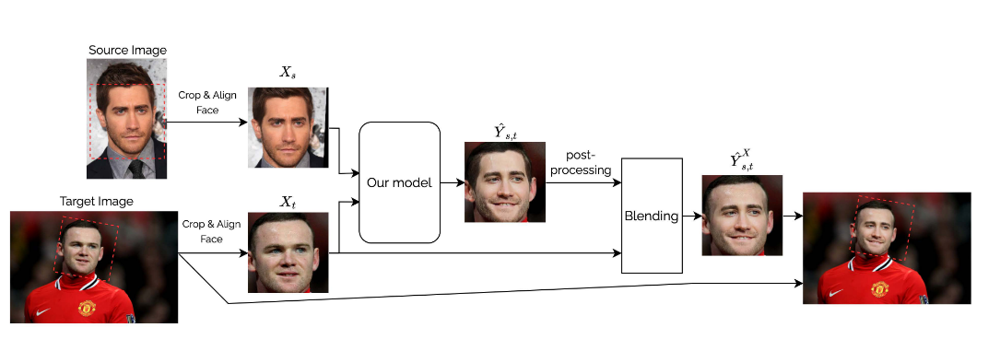

When we perform face swap we save the transformation matrix for extracted faces on the frames. This information helps us insert the already changed face into its original place on the frame. However, if we insert the whole image obtained by our model, visual artifacts usually appear on the edge of the inserted area on the original frame and are clearly visible. Therefore, it is necessary to ensure a smooth transition from the source image to the resulting
frame. For that reason we use segmentation masks.

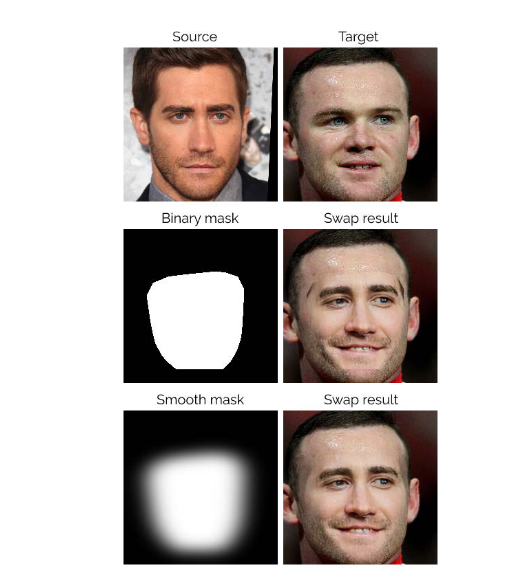

In [ ]:
def get_final_image(final_frames: List[np.ndarray],
                    crop_frames: List[np.ndarray],
                    full_frame: np.ndarray,
                    tfm_arrays: List[np.ndarray],
                    handler) -> None:
    """
    Create final video from frames
    """
    final = full_frame.copy()
    params = [None for i in range(len(final_frames))]

    for i in range(len(final_frames)):
        frame = cv2.resize(final_frames[i][0], (224, 224))

        # CROP AND ALIGN FACE
        landmarks = handler.get_without_detection_without_transform(frame)
        landmarks_tgt = handler.get_without_detection_without_transform(crop_frames[i][0])

        # CREATE MASK
        mask, _ = face_mask_static(crop_frames[i][0], landmarks, landmarks_tgt, params[i])
        mat_rev = cv2.invertAffineTransform(tfm_arrays[i][0])

        # SWAP RESULT and SMOOTHING
        swap_t = cv2.warpAffine(frame, mat_rev, (full_frame.shape[1], full_frame.shape[0]), borderMode=cv2.BORDER_REPLICATE)
        mask_t = cv2.warpAffine(mask, mat_rev, (full_frame.shape[1], full_frame.shape[0]))
        mask_t = np.expand_dims(mask_t, 2)

        final = mask_t*swap_t + (1-mask_t)*final
    final = np.array(final, dtype='uint8')
    return final


def show_images(images: List[np.ndarray],
                titles=None,
                figsize=(20, 5),
                fontsize=15):
    """
    Display created images
    """

    if titles:
        assert len(titles) == len(images), "Amount of images should be the same as the amount of titles"

    fig, axes = plt.subplots(1, len(images), figsize=figsize)
    for idx, (ax, image) in enumerate(zip(axes, images)):
        ax.imshow(image[:, :, ::-1])
        if titles:
            ax.set_title(titles[idx], fontsize=fontsize)
        ax.axis("off")

In [ ]:
def get_final_video(final_frames: List[np.ndarray],
                    crop_frames: List[np.ndarray],
                    full_frames: List[np.ndarray],
                    tfm_array: List[np.ndarray],
                    OUT_VIDEO_NAME: str,
                    fps: float,
                    handler) -> None:
    """
    Create final video from frames
    """

    out = cv2.VideoWriter(f"{OUT_VIDEO_NAME}", cv2.VideoWriter_fourcc(*'mp4v'), fps, (full_frames[0].shape[1], full_frames[0].shape[0]))
    size = (full_frames[0].shape[0], full_frames[0].shape[1])
    params = [None for i in range(len(crop_frames))]
    result_frames = full_frames.copy()

    # Loop through every frame
    for i in tqdm(range(len(full_frames))):
        if i == len(full_frames):
            break
        for j in range(len(crop_frames)):
            try:
                swap = cv2.resize(final_frames[j][i], (224, 224))

                if len(crop_frames[j][i]) == 0:
                    params[j] = None
                    continue

                # Landmark detection
                landmarks = handler.get_without_detection_without_transform(swap)
                if params[j] == None:
                    landmarks_tgt = handler.get_without_detection_without_transform(crop_frames[j][i])
                    mask, params[j] = face_mask_static(swap, landmarks, landmarks_tgt, params[j])
                else:
                    mask = face_mask_static(swap, landmarks, landmarks_tgt, params[j])

                # per frame masking and swapping
                swap = torch.from_numpy(swap).cuda().permute(2,0,1).unsqueeze(0).type(torch.float32)
                mask = torch.from_numpy(mask).cuda().unsqueeze(0).unsqueeze(0).type(torch.float32)
                full_frame = torch.from_numpy(result_frames[i]).cuda().permute(2,0,1).unsqueeze(0)
                mat = torch.from_numpy(tfm_array[j][i]).cuda().unsqueeze(0).type(torch.float32)

                # adapting to timestep t
                mat_rev = kornia.invert_affine_transform(mat)
                swap_t = kornia.warp_affine(swap, mat_rev, size)
                mask_t = kornia.warp_affine(mask, mat_rev, size)
                final = (mask_t*swap_t + (1-mask_t)*full_frame).type(torch.uint8).squeeze().permute(1,2,0).cpu().detach().numpy()

                result_frames[i] = final
                torch.cuda.empty_cache()

            except Exception as e:
                pass

        out.write(result_frames[i])

    out.release()

## Now it's your turn!
Choose a target and a source image, as well as a batch size. Afterwards have a look at your results!

In [ ]:
#@markdown #**Upload source image and video**

#@markdown You have 2 options:
#@markdown 1. Video or image to image swap?
#@markdown 2. Use example images or choose your own pictures!
#@markdown (If you do a video swap there is a pregiven video with which you can apply your images for face swap)


                          # A few necessary imports
#------------------------------------------------------------------------------------------------------------------------------------#
from utils.inference.image_processing import crop_face, get_final_image, show_images
from utils.inference.video_processing import read_video, get_target, get_final_video, add_audio_from_another_video, face_enhancement
from utils.inference.core import model_inference
from network.AEI_Net import AEI_Net
from coordinate_reg.image_infer import Handler
from insightface_func.face_detect_crop_multi import Face_detect_crop
from arcface_model.iresnet import iresnet100
from models.pix2pix_model import Pix2PixModel
from models.config_sr import TestOptions
#------------------------------------------------------------------------------------------------------------------------------------#

target_type = 'image' #@param ["video", "image"]

# Choice for user : Own or example images
example_output_image = True #@param {type:"boolean"}

if example_output_image:
    source_path = 'examples/images/elon_musk.jpg'
    target_path = 'examples/images/beckham.jpg'
    source_full = cv2.imread(source_path)
    target_full = cv2.imread(target_path)

else:
    print("Choose a source Image: ")
    uploaded = files.upload()
    im = Image.open(BytesIO(uploaded [next(iter(uploaded))]))
    source_full = asarray(im)
    source_full = cv2.cvtColor(source_full, cv2.COLOR_BGR2RGB)

    print("Choose a target Image")
    uploaded2 = files.upload()
    im2 = Image.open(BytesIO(uploaded2 [next(iter(uploaded2))]))
    target_full = asarray(im2)
    target_full = cv2.cvtColor(target_full, cv2.COLOR_BGR2RGB)

# Preprocessing the video
path_to_video = 'examples/videos/nggyup.mp4'
OUT_VIDEO_NAME = "examples/results/result.mp4"
crop_size = 224


# Check, if we can detect face on the source image

try:
    source = crop_face(source_full, app, crop_size)[0]
    source = [source[:, :, ::-1]]
    print("Everything is ok!")
except TypeError:
    print("Bad source images, please choose another one.")

# Read in data
if target_type == 'image':
    full_frames = [target_full]

else:
  full_frames, fps = read_video(path_to_video)

target = get_target(full_frames, app, crop_size)

Everything is ok!


In [ ]:
#@markdown #**Inference**


batch_size =  10#@param {type:"integer"}

START_TIME = time.time()

final_frames_list, crop_frames_list, full_frames, tfm_array_list = model_inference(full_frames,
                                                                                   source,
                                                                                   target,
                                                                                   netArc,
                                                                                   G,
                                                                                 app,
                                                                                   set_target = False,
                                                                                   crop_size=crop_size,
                                                                                   BS=batch_size)

if use_sr:
    final_frames_list = face_enhancement(final_frames_list, model)

# produce fake video
if target_type == 'video':
  get_final_video(final_frames_list,
                  crop_frames_list,
                  full_frames,
                  tfm_array_list,
                  OUT_VIDEO_NAME,
                  fps,
                  handler)

  add_audio_from_another_video(path_to_video, OUT_VIDEO_NAME, "audio")

  print(f'Full pipeline took {time.time() - START_TIME}')
  print(f"Video saved with path {OUT_VIDEO_NAME}")
else:
  # produce fake image
  result = get_final_image(final_frames_list, crop_frames_list, full_frames[0], tfm_array_list, handler)
  cv2.imwrite('examples/results/result.png', result)

100%|██████████| 1/1 [00:00<00:00, 51.53it/s]
1it [00:00, 314.44it/s]
1it [00:00, 332.12it/s]
100%|██████████| 1/1 [00:00<00:00, 1975.65it/s]


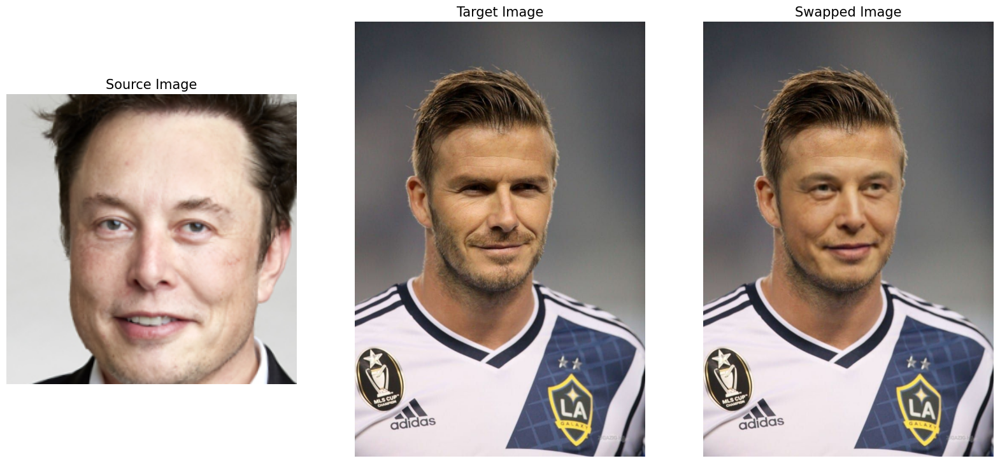

In [ ]:
#@markdown #**Visualize Image to Image swap**

import matplotlib.pyplot as plt

show_images([source[0][:, :, ::-1], target_full, result], ['Source Image', 'Target Image', 'Swapped Image'], figsize=(20, 15))


In [ ]:
#@markdown #**Visualize Video Swap**

from IPython.display import HTML
from base64 import b64encode

video_file = open(OUT_VIDEO_NAME, "r+b").read()
video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"

HTML(f"""<video width={800} controls><source src="{video_url}"></video>""")